In [96]:
#Cell only to import all the necessary libraries
import pandas as pd
import numpy as np

import dataframe_image as dfi

import geopandas as gpd

import matplotlib.pyplot as plt
import seaborn as sns

import cufflinks as cf
from IPython.display import display,HTML
cf.set_config_file(sharing = 'public',theme='ggplot',offline=True)
import folium
from folium import plugins
import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import iplot
from plotly.subplots import make_subplots
from jinja2 import Template

from sklearn import linear_model

In [97]:
def configure_plotly_browser_state():
  import IPython
  display(IPython.core.display.HTML('''
        <script src="/static/components/requirejs/require.js"></script>
        <script>
          requirejs.config({
            paths: {
              base: '/static/base',
              plotly: 'https://cdn.plot.ly/plotly-latest.min.js?noext',
            },
          });
        </script>
        '''))

In [98]:
cf.getThemes()

['ggplot', 'pearl', 'solar', 'space', 'white', 'polar', 'henanigans']

## Initial Data


In [99]:
cols=["Item",'Description']
initial_columns = pd.DataFrame(columns=cols)
initial_columns.set_index("Item",inplace=True)
initial_columns.loc['Tipo'] = ['Kind of construction: ' 'Apartmento: Apartment, '
                               'Casa: House, ' 'Oficina/Consultorio: Office/consulting room, '
                                'Local:shop, ' 'edificio: building, ''Bodega: store '
                                'Finca: Summer house (in this case, because is a city)'
                                'Lote: Property without any construction']
initial_columns.loc['Descripcion'] = ['A short description of the kind of contruction '
'and andlocation']
initial_columns.loc['Localizacion'] = ['A detailed description of the localization']
initial_columns.loc['Atributos'] = ['Features of the contruction']
initial_columns.loc['Valor'] = ['Price of the contruction']
initial_columns

,Description
Item,
Tipo,"Kind of construction: Apartmento: Apartment, C..."
Descripcion,A short description of the kind of contruction...
Localizacion,A detailed description of the localization
Atributos,Features of the contruction
Valor,Price of the contruction


## In the next cell, you can see the information imported from the original database.

The information in each column has different content, in the case of "tipo" we can see that don't have any problem, but in the case of "localizacion" and "Atributos", the information is confused and grouped in one cell.

In [100]:
#Connection with google
# from google.colab import drive

#Authorization
# drive.mount('/content/drive')
#Import data from google drive
inmuebles = pd.read_csv('DATOS\inmuebles_original.csv',encoding='utf-8')
inmuebles

,Tipo,Descripcion,Localizacion,Atributos,Valor
0,Apartamento,Apartamento en venta en Zona Noroccidental,"Zona Noroccidental, Bogotá D.C, Cundinamarca",3 habitaciones2 baños70 m²,$ 360.000.000
1,Casa,Casa en venta en Castilla,"Castilla, Kennedy, Zona Suroccidental, Bogotá ...",4 habitaciones3 baños170 m²,$ 670.000.000
2,Apartamento,Apartamento en venta en Chico Reservado,"Chico Reservado, Chapinero, Zona Chapinero, Bo...",3 habitaciones3 baños144 / 144 m²,$ 1.120.000.000
3,Apartamento,Apartamento en venta en Usaquén,"Usaquén, Zona Norte, Bogotá D.C, Cundinamarca",3 habitaciones2 baños154 / 134 m²,$ 890.000.000
4,Apartamento,Apartamento en venta en Bella Suiza,"Bella Suiza, Usaquén, Zona Norte, Bogotá D.C, ...",2 habitaciones3 baños128 m²,$ 970.000.000
...,...,...,...,...,...
9515,Apartamento,Apartamento en venta en Kennedy,"Kennedy, Zona Suroccidental, Bogotá D.C, Cundi...",3 habitaciones2 baños70 / 70 m²,$ 290.000.000
9516,Apartamento,Apartamento en venta en Parque Central Bavaria,"Parque Central Bavaria, Santa Fe, Zona Centro,...",2 habitaciones2 baños100 / 90 m²,$ 670.000.000
9517,Local,Local en venta en Restrepo,"Restrepo, Antonio Nariño, Zona Sur, Bogotá D.C...",8 habitaciones6 baños383 m²,$ 900.000.000
9518,Casa,Casa en venta en Engativa,"Engativa, Zona Occidental, Bogotá D.C, Cundina...",3 habitaciones2 baños183 m²,$ 335.000.000


### Initially we can't detect null values in the initial data.

In [101]:
inmuebles.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9520 entries, 0 to 9519
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Tipo          9520 non-null   object
 1   Descripcion   9520 non-null   object
 2   Localizacion  9520 non-null   object
 3   Atributos     9520 non-null   object
 4   Valor         9520 non-null   object
dtypes: object(5)
memory usage: 372.0+ KB


### In the case of the column "Tipo", we can see seven kind of construcstions or buildings.

- Casa -- > House
- Oficina --> Office
- Local --> Shop
- Edificio --> Building
- Bodega --> Warehouse
- Finca --> Farm
- Lote --> Terrain without construction in the city

In [102]:
inmuebles['Tipo'].value_counts()

Tipo
Apartamento            7327
Casa                   2043
Oficina/Consultorio      60
Local                    38
Edificio                 22
Bodega                   13
Finca                    11
Lote                      6
Name: count, dtype: int64

### I decided create a new dataframe where, we can find new columns that come from the colum called "Localizacion"

In [103]:
#Creation of a new dataframe with the data of the column Localizacion
split_columns = inmuebles["Localizacion"].str.split(pat=",", expand=True)
split_columns.head()

,0,1,2,3,4
0,Zona Noroccidental,Bogotá D.C,Cundinamarca,None,None
1,Castilla,Kennedy,Zona Suroccidental,Bogotá D.C,Cundinamarca
2,Chico Reservado,Chapinero,Zona Chapinero,Bogotá D.C,Cundinamarca
3,Usaquén,Zona Norte,Bogotá D.C,Cundinamarca,None
4,Bella Suiza,Usaquén,Zona Norte,Bogotá D.C,Cundinamarca


### Now we can see the null data in this new data frame and review each column to extract valuable information, and discard the unnecesary data.


In [104]:
split_columns.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9520 entries, 0 to 9519
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   0       9520 non-null   object
 1   1       9520 non-null   object
 2   2       9506 non-null   object
 3   3       8629 non-null   object
 4   4       3591 non-null   object
dtypes: object(5)
memory usage: 372.0+ KB


#### We can see that in the case of the last column we have the same information, ''Cundinamarca'', this is the name of the State where Bogota is located, as our interest is just the real state in Bogotá, this column is unnecesary.

In [105]:
split_columns = split_columns.drop(4, axis=1)

#### In the case of colum 3, we see three kind of records: ''Cundinamarca'', ''Bogotá'' and null values, we already know that Bogota is in Cundinamarca, so at the beginning we replaced the word ''Cundinamarca'', with ''Bogota'' (We eliminate this characters ''´, D.C'') and None with ''Bogota''. But, as all the locations are in Bogota, this column is going to be unnecesary too.

In [106]:
split_columns[3].value_counts()

3
 Cundinamarca    5038
 Bogotá D.C      3591
Name: count, dtype: int64

In [107]:
# Code to delete the trhid column where all the records are ''bogota''
split_columns = split_columns.drop(3, axis=1)
split_columns

,0,1,2
0,Zona Noroccidental,Bogotá D.C,Cundinamarca
1,Castilla,Kennedy,Zona Suroccidental
2,Chico Reservado,Chapinero,Zona Chapinero
3,Usaquén,Zona Norte,Bogotá D.C
4,Bella Suiza,Usaquén,Zona Norte
...,...,...,...
9515,Kennedy,Zona Suroccidental,Bogotá D.C
9516,Parque Central Bavaria,Santa Fe,Zona Centro
9517,Restrepo,Antonio Nariño,Zona Sur
9518,Engativa,Zona Occidental,Bogotá D.C


### After, a review of this dataframe show null data in the [2] column. An analysis show that all this nan values, don't have information about the internal locations in bogota (as neighborhood), one of the objectives is find relation between location and several features. So in this case we talk about 14 records, I consider that delete this records wouldn't have a big effect in future models.

In [108]:
split_columns.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9520 entries, 0 to 9519
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   0       9520 non-null   object
 1   1       9520 non-null   object
 2   2       9506 non-null   object
dtypes: object(3)
memory usage: 223.3+ KB


In [109]:
split_columns[2].value_counts()

2
 Bogotá D.C            5038
 Zona Norte            1435
 Cundinamarca           877
 Zona Chapinero         805
 Zona Noroccidental     747
 Zona Occidental        255
 Zona Suroccidental     190
 Zona Centro             81
 Zona Sur                78
Name: count, dtype: int64

In [110]:
#Was necessary turn from object to string the type of data of all the dataframe to filter
split_columns = split_columns.astype('string')
split_columns.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9520 entries, 0 to 9519
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   0       9520 non-null   string
 1   1       9520 non-null   string
 2   2       9506 non-null   string
dtypes: string(3)
memory usage: 223.3 KB


Here, the data was filtered by the column [2] with the records that have the word ''Cundinamarca'', this is word that appear in 14 records, but this is not the reason to review this record, the real reason is that the name of the state where the city of Bogota is localized, while the other records are neighborhood or zones or contain the name of ''Bogota D.C''. So, I deleted this values

In [111]:
condition = split_columns[1].str.contains('Cundinamarca')
# Apply the condition to filter records
filtered_df = split_columns[condition]
filtered_df

,0,1,2
368,Bogotá D.C,Cundinamarca,<NA>
415,Bogotá D.C,Cundinamarca,<NA>
446,Bogotá D.C,Cundinamarca,<NA>
447,Bogotá D.C,Cundinamarca,<NA>
487,Bogotá D.C,Cundinamarca,<NA>
488,Bogotá D.C,Cundinamarca,<NA>
807,Bogotá D.C,Cundinamarca,<NA>
1735,Bogotá D.C,Cundinamarca,<NA>
2305,Bogotá D.C,Cundinamarca,<NA>
3772,Bogotá D.C,Cundinamarca,<NA>


In [112]:
#Creation of an index, that is going to be necessary to filter the main dataframe
split_columns['id']=np.arange(len(split_columns))

#I delete the null records in split_columns[2]
split_columns.dropna(subset=[2], inplace=True)

split_columns

,0,1,2,id
0,Zona Noroccidental,Bogotá D.C,Cundinamarca,0
1,Castilla,Kennedy,Zona Suroccidental,1
2,Chico Reservado,Chapinero,Zona Chapinero,2
3,Usaquén,Zona Norte,Bogotá D.C,3
4,Bella Suiza,Usaquén,Zona Norte,4
...,...,...,...,...
9515,Kennedy,Zona Suroccidental,Bogotá D.C,9515
9516,Parque Central Bavaria,Santa Fe,Zona Centro,9516
9517,Restrepo,Antonio Nariño,Zona Sur,9517
9518,Engativa,Zona Occidental,Bogotá D.C,9518


#### Now, the data frame have 9506 records of 9520, I delete the columns that didn't have any information about location (Neigborhood, localidad or zone)

In [113]:
#change the type of data from object to string
split_columns[2] = split_columns[2].astype('string')
#I eliminate the spaces in the records of column 2
split_columns[2] = split_columns[2].str.strip()
#finally I replaced the records "Cundinamarca" and "Bogotá DC" for "Zona No Definida"
split_columns[2]=split_columns[2].replace('Cundinamarca','Zona No Definida')
split_columns[2]=split_columns[2].replace('Bogotá D.C','Zona No Definida')
split_columns

,0,1,2,id
0,Zona Noroccidental,Bogotá D.C,Zona No Definida,0
1,Castilla,Kennedy,Zona Suroccidental,1
2,Chico Reservado,Chapinero,Zona Chapinero,2
3,Usaquén,Zona Norte,Zona No Definida,3
4,Bella Suiza,Usaquén,Zona Norte,4
...,...,...,...,...
9515,Kennedy,Zona Suroccidental,Zona No Definida,9515
9516,Parque Central Bavaria,Santa Fe,Zona Centro,9516
9517,Restrepo,Antonio Nariño,Zona Sur,9517
9518,Engativa,Zona Occidental,Zona No Definida,9518


In [114]:
#change the type of data from object to string
split_columns[1] = split_columns[1].astype('string')
#I eliminate the spaces in the records of column 2
split_columns[1] = split_columns[1].str.strip()
#I replace the records ''Bogotá DC'' for Localidad No Definida
split_columns[1]=split_columns[1].replace('Bogotá D.C','Localidad No Definida')

In [115]:
# pd.set_option('display.max_columns', None)
# pd.set_option('display.max_rows', None)

# pd.set_option('min_row', 10)
# pd.get_option('min_columns', 10)

In [116]:
split_columns

,0,1,2,id
0,Zona Noroccidental,Localidad No Definida,Zona No Definida,0
1,Castilla,Kennedy,Zona Suroccidental,1
2,Chico Reservado,Chapinero,Zona Chapinero,2
3,Usaquén,Zona Norte,Zona No Definida,3
4,Bella Suiza,Usaquén,Zona Norte,4
...,...,...,...,...
9515,Kennedy,Zona Suroccidental,Zona No Definida,9515
9516,Parque Central Bavaria,Santa Fe,Zona Centro,9516
9517,Restrepo,Antonio Nariño,Zona Sur,9517
9518,Engativa,Zona Occidental,Zona No Definida,9518


### Bogotá has a internal division: Neigborhoods as the smallest area, Localidad (is a area that has several neighborhoods), and finally Zone. The variable ''Zone'' is used to this analysis, but is not an administrative or an official division of the city.

In [117]:
#The columns take the names that correspond to the division of locations
#in Bogotá.
split_columns.columns = ['Neighborhood', 'Localidad', 'Zone','Id']


#### We review the neighborhoods that have the wrong record called ''zona noroccidental'' (that refers to the northwest zone of the city), and I found that this records don´t have information in the other columns. These rows are approximately the 10% of all the available data. So, I decided replace the values of column Zone "Zona No Definida" with the values of the column Neigborhood than contains: "Zona Noroccidental".

In [118]:
split_columns[split_columns['Neighborhood']=='Zona Noroccidental']

,Neighborhood,Localidad,Zone,Id
0,Zona Noroccidental,Localidad No Definida,Zona No Definida,0
15,Zona Noroccidental,Localidad No Definida,Zona No Definida,15
18,Zona Noroccidental,Localidad No Definida,Zona No Definida,18
19,Zona Noroccidental,Localidad No Definida,Zona No Definida,19
22,Zona Noroccidental,Localidad No Definida,Zona No Definida,22
...,...,...,...,...
8890,Zona Noroccidental,Localidad No Definida,Zona No Definida,8890
9172,Zona Noroccidental,Localidad No Definida,Zona No Definida,9172
9200,Zona Noroccidental,Localidad No Definida,Zona No Definida,9200
9211,Zona Noroccidental,Localidad No Definida,Zona No Definida,9211


In [119]:
#1. si columna zona tiene de valor ''zona no definida''
#2. mirar  que valor hay a la izquirda
#3. si es alguna de las zonas agregar
#4. si es no definido mantener

### I decided review how records in the column ''Zone'' has the value ''Zona no definida'' that means Not defined zone. And I found that the dataset has 5915 records with this value, and this must be fixed.

So, I replaced the major part of values "zona no definida" for the names of zones that are located in the columns Neighborhoods and Localidad.

In [120]:
split_columns['Zone'].value_counts()

Zone
Zona No Definida      5915
Zona Norte            1435
Zona Chapinero         805
Zona Noroccidental     747
Zona Occidental        255
Zona Suroccidental     190
Zona Centro             81
Zona Sur                78
Name: count, dtype: Int64

In [121]:
# code to replace the records ''Zona no definida/Zone not defined'' for the name
# of the repective zone that are available in the columns "localidad" and "Neigborhood"
split_columns['Zone'] = split_columns.apply(lambda x: x['Localidad'] if x['Zone'] ==
                                            "Zona No Definida" and x['Localidad'] in ["Zona Suroccidental",
                                                                                      "Zona Norte", "Zona Occidental","Zona Noroccidental",
                                                                                      "Zona Sur","Zona Centro","Zona Chapinero "] else x['Zone'], axis=1)

split_columns['Zone'] = split_columns.apply(lambda x: x['Neighborhood'] if x['Zone'] ==
                                            "Zona No Definida" and x['Neighborhood'] in ["Zona Suroccidental",
                                                                                         "Zona Norte", "Zona Occidental","Zona Noroccidental",
                                                                                         "Zona Sur","Zona Centro","Zona Chapinero "] else x['Zone'], axis=1)
split_columns

,Neighborhood,Localidad,Zone,Id
0,Zona Noroccidental,Localidad No Definida,Zona Noroccidental,0
1,Castilla,Kennedy,Zona Suroccidental,1
2,Chico Reservado,Chapinero,Zona Chapinero,2
3,Usaquén,Zona Norte,Zona Norte,3
4,Bella Suiza,Usaquén,Zona Norte,4
...,...,...,...,...
9515,Kennedy,Zona Suroccidental,Zona Suroccidental,9515
9516,Parque Central Bavaria,Santa Fe,Zona Centro,9516
9517,Restrepo,Antonio Nariño,Zona Sur,9517
9518,Engativa,Zona Occidental,Zona Occidental,9518


### We had 5915 "Zona No Definida" or ''Not defined zone'' in the column Zone, and now we have 985 records with that value.

For the other hand, ''Zona Chapinero'' corresponds to east zone or in spanish ''Zona oriental'' so, I decided change the name of all this records.

In [122]:
split_columns['Zone'].value_counts()

Zone
Zona Norte            2540
Zona Noroccidental    2067
Zona Suroccidental    1368
Zona Occidental        987
Zona No Definida       985
Zona Chapinero         805
Zona Sur               396
Zona Centro            358
Name: count, dtype: int64

In [123]:
split_columns['Zone']=split_columns['Zone'].replace('Zona Chapinero','Zona Oriental')
split_columns['Zone'].value_counts()

Zone
Zona Norte            2540
Zona Noroccidental    2067
Zona Suroccidental    1368
Zona Occidental        987
Zona No Definida       985
Zona Oriental          805
Zona Sur               396
Zona Centro            358
Name: count, dtype: int64

In [124]:
split_columns['Localidad']=split_columns['Localidad'].replace('Zona Chapinero','Zona Oriental')
split_columns['Localidad'].value_counts()

Localidad
Usaquén                  1435
Zona Suroccidental       1178
Zona Norte               1105
Zona Oriental             985
Localidad No Definida     877
Suba                      747
Zona Occidental           732
Chapinero                 677
Zona Noroccidental        443
Zona Sur                  318
Zona Centro               277
Kennedy                   185
Fontibón                  176
Teusaquillo               128
Engativa                   79
Santa Fe                   59
Ciudad Bolívar             43
Antonio Nariño             18
Los Mártires               17
Rafael Uribe Uribe         10
La Candelaria               5
Bosa                        5
Tunjuelito                  5
Usme                        2
Name: count, dtype: Int64

In [125]:
split_columns['Localidad'].value_counts()

Localidad
Usaquén                  1435
Zona Suroccidental       1178
Zona Norte               1105
Zona Oriental             985
Localidad No Definida     877
Suba                      747
Zona Occidental           732
Chapinero                 677
Zona Noroccidental        443
Zona Sur                  318
Zona Centro               277
Kennedy                   185
Fontibón                  176
Teusaquillo               128
Engativa                   79
Santa Fe                   59
Ciudad Bolívar             43
Antonio Nariño             18
Los Mártires               17
Rafael Uribe Uribe         10
La Candelaria               5
Bosa                        5
Tunjuelito                  5
Usme                        2
Name: count, dtype: Int64

#### Then I did the same exercise with "Localidad", I used the column "Neighborhood" to search records that must be in the column "Localidad".

In [126]:
#Code to replaces the values as: "Zona Suroccidental", "Zona norte", etc. located
#in the column "Localidad" by Usaquén, Chapinero, Santa Fe, etc. that are located
#in the column neighborhood.

#As a citizien of Bogotá I know that some names in neighborhood must go in "Localidad"

split_columns['Localidad'] = split_columns.apply(lambda x: x['Neighborhood'] if x['Localidad'] =='Zona Occidental'
or x['Localidad'] =='Zona Suroccidental'or x['Localidad'] =='Zona Norte'or x['Localidad'] =='Zona Noroccidental'
or x['Localidad'] =='Zona Centro'or x['Localidad'] =='Zona Oriental'or x['Localidad'] =='Zona Sur'
                                            and x['Neighborhood'] in ["Usaquén","Chapinero",
                                                                      "Santa Fe","San Cristobál",
                                                                      "San Cristobal","Usme","Tunjuelito",
                                                                      'Bosa','Kennedy','Fontibón','Fontibon',
                                                                      'Engativá','Suba','Barrios Unidos',
                                                                      'Teusaquillo','Los Mártires','Antonio Nariño',
                                                                      'Puente Aranda','Candelaria','Rafael Uribe Uribe',
                                                                      'Ciudad Bolívar','Sumapaz'] else x['Localidad'], axis=1)

In [127]:
split_columns['Localidad'].value_counts()

Localidad
Usaquén                  2540
Suba                     1190
Chapinero                1009
Localidad No Definida     877
Kennedy                   774
Bosa                      594
Engativa                  541
Barrios Unidos            473
Fontibón                  446
Teusaquillo               308
Santa Fe                  150
Ciudad Bolívar            127
Puente Aranda             116
Rafael Uribe Uribe         78
Antonio Nariño             66
Los Mártires               55
Usme                       53
San Cristobal              38
La Candelaria              37
Tunjuelito                 34
Name: count, dtype: int64

#### Finally to finish with this Data Frame, Im going to search the zone according to the "Localidad"

In [128]:
split_columns['Zone'].value_counts()

Zone
Zona Norte            2540
Zona Noroccidental    2067
Zona Suroccidental    1368
Zona Occidental        987
Zona No Definida       985
Zona Oriental          805
Zona Sur               396
Zona Centro            358
Name: count, dtype: int64

### As I said previously, as a citizien of Bogotá I know what "Localidades" are in  each zone of Bogotá, so I create a dictionary to fix the column zone

In [129]:
dict_zonas = {"Zona Occidental": ["Engativa",'Fontibón'], "Zona Norte": ["Usaquén"],
              'Zona Suroccidental':['Bosa','Kennedy'],'Zona Noroccidental':['Suba'],
              'Zona Centro':['La Candelaria','Puente Aranda','Santa Fe','Los Mártires'],
              'Zona Oriental':['Chapinero','Barrios Unidos','Teusaquillo'],'Zona Sur':
              ['Usme','Rafael Uribe Uribe','Antonio Nariño','Ciudad Bolívar','San Cristobal',
               'Tunjuelito']}

def map_zones(localidad):
  for i in split_columns['Zone']:
    if i =='Zona No Definida':
      for zone, localidades in dict_zonas.items():
        if localidad == 'Localidad No Definida':
          break
        if localidad in localidades:
          return zone
    else:
      continue

# Apply the mapping function to the 'Localidad' column and create a 'New_Zone' column
split_columns['New_Zone'] = split_columns['Localidad'].map(map_zones)
#Replace the values None by the correct values using the column Zone
split_columns['New_Zone'].fillna(split_columns['Zone'], inplace=True)
# Drop the 'Zone' column and rename 'New_Zone' to 'Zone'
split_columns.drop(columns=['Zone'], inplace=True)

In [130]:
split_columns['New_Zone'].value_counts()

New_Zone
Zona Norte            2540
Zona Noroccidental    2067
Zona Oriental         1790
Zona Suroccidental    1368
Zona Occidental        987
Zona Sur               396
Zona Centro            358
Name: count, dtype: int64

In [131]:
#I rename the column new_zones
split_columns.rename(columns={'New_Zone': 'Zone'}, inplace=True)
# I Define the order I want for the columns
desired_order = ['Neighborhood', 'Localidad', 'Zone','Id']
# Reorder the columns based on the desired order
split_columns = split_columns[desired_order]


In [132]:
split_columns['Zone'].value_counts()

Zone
Zona Norte            2540
Zona Noroccidental    2067
Zona Oriental         1790
Zona Suroccidental    1368
Zona Occidental        987
Zona Sur               396
Zona Centro            358
Name: count, dtype: int64

## I merged the dataframes "split column" and "inmuebles", that is the original dataframe. Now, the next task is organize the column "Atributos", that means "atributes" or characteristics of the house.

I took the information in the column ''Atributos'' and I transform in three columns: ''Habitaciones'' (rooms), "baños" (bathrooms), and "area" in square meters.

In [133]:
#Numerate the rows
inmuebles['id']=np.arange(len(inmuebles))
#merge the dataframes
inmuebles = pd.merge(inmuebles, split_columns, left_on='id',
                         right_on='Id', how='left')
#drop the repeated column called id
inmuebles.drop(columns='Id', inplace=True)
inmuebles

,Tipo,Descripcion,Localizacion,Atributos,Valor,id,Neighborhood,Localidad,Zone
0,Apartamento,Apartamento en venta en Zona Noroccidental,"Zona Noroccidental, Bogotá D.C, Cundinamarca",3 habitaciones2 baños70 m²,$ 360.000.000,0,Zona Noroccidental,Localidad No Definida,Zona Noroccidental
1,Casa,Casa en venta en Castilla,"Castilla, Kennedy, Zona Suroccidental, Bogotá ...",4 habitaciones3 baños170 m²,$ 670.000.000,1,Castilla,Kennedy,Zona Suroccidental
2,Apartamento,Apartamento en venta en Chico Reservado,"Chico Reservado, Chapinero, Zona Chapinero, Bo...",3 habitaciones3 baños144 / 144 m²,$ 1.120.000.000,2,Chico Reservado,Chapinero,Zona Oriental
3,Apartamento,Apartamento en venta en Usaquén,"Usaquén, Zona Norte, Bogotá D.C, Cundinamarca",3 habitaciones2 baños154 / 134 m²,$ 890.000.000,3,Usaquén,Usaquén,Zona Norte
4,Apartamento,Apartamento en venta en Bella Suiza,"Bella Suiza, Usaquén, Zona Norte, Bogotá D.C, ...",2 habitaciones3 baños128 m²,$ 970.000.000,4,Bella Suiza,Usaquén,Zona Norte
...,...,...,...,...,...,...,...,...,...
9515,Apartamento,Apartamento en venta en Kennedy,"Kennedy, Zona Suroccidental, Bogotá D.C, Cundi...",3 habitaciones2 baños70 / 70 m²,$ 290.000.000,9515,Kennedy,Kennedy,Zona Suroccidental
9516,Apartamento,Apartamento en venta en Parque Central Bavaria,"Parque Central Bavaria, Santa Fe, Zona Centro,...",2 habitaciones2 baños100 / 90 m²,$ 670.000.000,9516,Parque Central Bavaria,Santa Fe,Zona Centro
9517,Local,Local en venta en Restrepo,"Restrepo, Antonio Nariño, Zona Sur, Bogotá D.C...",8 habitaciones6 baños383 m²,$ 900.000.000,9517,Restrepo,Antonio Nariño,Zona Sur
9518,Casa,Casa en venta en Engativa,"Engativa, Zona Occidental, Bogotá D.C, Cundina...",3 habitaciones2 baños183 m²,$ 335.000.000,9518,Engativa,Engativa,Zona Occidental


In [134]:
#I transalate to english the zones
replacements={'Zona Oriental':'East Zone','Zona Occidental':'West Zone','Zona Sur':'South Zone',
                                            'Zona Norte':'North Zone','Zona Suroccidental':'Southwest Zone','Zona Noroccidental':'Northwest Zone',
                                            'Zona Centro':'Center Zone'}
inmuebles['Zone'] = inmuebles['Zone'].replace(replacements)
inmuebles

,Tipo,Descripcion,Localizacion,Atributos,Valor,id,Neighborhood,Localidad,Zone
0,Apartamento,Apartamento en venta en Zona Noroccidental,"Zona Noroccidental, Bogotá D.C, Cundinamarca",3 habitaciones2 baños70 m²,$ 360.000.000,0,Zona Noroccidental,Localidad No Definida,Northwest Zone
1,Casa,Casa en venta en Castilla,"Castilla, Kennedy, Zona Suroccidental, Bogotá ...",4 habitaciones3 baños170 m²,$ 670.000.000,1,Castilla,Kennedy,Southwest Zone
2,Apartamento,Apartamento en venta en Chico Reservado,"Chico Reservado, Chapinero, Zona Chapinero, Bo...",3 habitaciones3 baños144 / 144 m²,$ 1.120.000.000,2,Chico Reservado,Chapinero,East Zone
3,Apartamento,Apartamento en venta en Usaquén,"Usaquén, Zona Norte, Bogotá D.C, Cundinamarca",3 habitaciones2 baños154 / 134 m²,$ 890.000.000,3,Usaquén,Usaquén,North Zone
4,Apartamento,Apartamento en venta en Bella Suiza,"Bella Suiza, Usaquén, Zona Norte, Bogotá D.C, ...",2 habitaciones3 baños128 m²,$ 970.000.000,4,Bella Suiza,Usaquén,North Zone
...,...,...,...,...,...,...,...,...,...
9515,Apartamento,Apartamento en venta en Kennedy,"Kennedy, Zona Suroccidental, Bogotá D.C, Cundi...",3 habitaciones2 baños70 / 70 m²,$ 290.000.000,9515,Kennedy,Kennedy,Southwest Zone
9516,Apartamento,Apartamento en venta en Parque Central Bavaria,"Parque Central Bavaria, Santa Fe, Zona Centro,...",2 habitaciones2 baños100 / 90 m²,$ 670.000.000,9516,Parque Central Bavaria,Santa Fe,Center Zone
9517,Local,Local en venta en Restrepo,"Restrepo, Antonio Nariño, Zona Sur, Bogotá D.C...",8 habitaciones6 baños383 m²,$ 900.000.000,9517,Restrepo,Antonio Nariño,South Zone
9518,Casa,Casa en venta en Engativa,"Engativa, Zona Occidental, Bogotá D.C, Cundina...",3 habitaciones2 baños183 m²,$ 335.000.000,9518,Engativa,Engativa,West Zone


In [135]:
inmuebles['Tipo'].value_counts()

Tipo
Apartamento            7327
Casa                   2043
Oficina/Consultorio      60
Local                    38
Edificio                 22
Bodega                   13
Finca                    11
Lote                      6
Name: count, dtype: int64

In [136]:
#separate the column Aatributos in several columns
atributos = inmuebles['Atributos'].str.split(' ', expand=True)
atributos.columns = ['Habitaciones', 'Baños', 'Area', 'Area2','Area3','Area4']

In [137]:
#I eliminate te unnecesary words
atributos['Baños'] = atributos['Baños'].str.replace('habitaciones', '')
atributos['Baños'] = atributos['Baños'].str.replace('habitación', '')
atributos['Area'] = atributos['Area'].str.replace('baño', '')
atributos['Area'] = atributos['Area'].str.replace('s', '')

### I deleted the unnecesary columns and create an id column to merge with the dataframe inmuebles

In [138]:
#delete columns
columns_to_delete = ['Area2', 'Area3','Area4']
atributos.drop(columns=columns_to_delete, inplace=True)

atributos['id']=np.arange(len(atributos))

atributos

,Habitaciones,Baños,Area,id
0,3,2,70,0
1,4,3,170,1
2,3,3,144,2
3,3,2,154,3
4,2,3,128,4
...,...,...,...,...
9515,3,2,70,9515
9516,2,2,100,9516
9517,8,6,383,9517
9518,3,2,183,9518


In [139]:
inmuebles = pd.merge(inmuebles, atributos, left_on='id',
                        right_on='id', how='left')

In [140]:
#I deleted the columns "Localizacion" and "Atributos"
columns_to_delete = ['Localizacion', 'Atributos']
inmuebles.drop(columns=columns_to_delete, inplace=True)
inmuebles['id']=np.arange(len(inmuebles))
#rename the titles of the columns
inmuebles = inmuebles.rename(columns={'Tipo': 'Type', 'Descripcion': 'Description','Valor': 'Value',
                        'id': 'id','Neighborhood': 'Neighborhood',
                        'Localidad': 'Localidad','Zone': 'Zone','Habitaciones': 'Rooms',
                        'Baños': 'Bathrooms','Area': 'Area'})
inmuebles

,Type,Description,Value,id,Neighborhood,Localidad,Zone,Rooms,Bathrooms,Area
0,Apartamento,Apartamento en venta en Zona Noroccidental,$ 360.000.000,0,Zona Noroccidental,Localidad No Definida,Northwest Zone,3,2,70
1,Casa,Casa en venta en Castilla,$ 670.000.000,1,Castilla,Kennedy,Southwest Zone,4,3,170
2,Apartamento,Apartamento en venta en Chico Reservado,$ 1.120.000.000,2,Chico Reservado,Chapinero,East Zone,3,3,144
3,Apartamento,Apartamento en venta en Usaquén,$ 890.000.000,3,Usaquén,Usaquén,North Zone,3,2,154
4,Apartamento,Apartamento en venta en Bella Suiza,$ 970.000.000,4,Bella Suiza,Usaquén,North Zone,2,3,128
...,...,...,...,...,...,...,...,...,...,...
9515,Apartamento,Apartamento en venta en Kennedy,$ 290.000.000,9515,Kennedy,Kennedy,Southwest Zone,3,2,70
9516,Apartamento,Apartamento en venta en Parque Central Bavaria,$ 670.000.000,9516,Parque Central Bavaria,Santa Fe,Center Zone,2,2,100
9517,Local,Local en venta en Restrepo,$ 900.000.000,9517,Restrepo,Antonio Nariño,South Zone,8,6,383
9518,Casa,Casa en venta en Engativa,$ 335.000.000,9518,Engativa,Engativa,West Zone,3,2,183


In [141]:
inmuebles = inmuebles.dropna()
inmuebles.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9506 entries, 0 to 9519
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   Type          9506 non-null   object
 1   Description   9506 non-null   object
 2   Value         9506 non-null   object
 3   id            9506 non-null   int32 
 4   Neighborhood  9506 non-null   string
 5   Localidad     9506 non-null   object
 6   Zone          9506 non-null   object
 7   Rooms         9506 non-null   object
 8   Bathrooms     9506 non-null   object
 9   Area          9506 non-null   object
dtypes: int32(1), object(8), string(1)
memory usage: 779.8+ KB


In [142]:
inmuebles['Value']=inmuebles['Value'].str.replace(".","")
inmuebles['Value']=inmuebles['Value'].str.replace("$","")
inmuebles['Value'] = inmuebles['Value'].astype(str).apply(lambda x: x[:-6])
inmuebles['Value']=inmuebles['Value'].astype(float)
inmuebles

,Type,Description,Value,id,Neighborhood,Localidad,Zone,Rooms,Bathrooms,Area
0,Apartamento,Apartamento en venta en Zona Noroccidental,360.0,0,Zona Noroccidental,Localidad No Definida,Northwest Zone,3,2,70
1,Casa,Casa en venta en Castilla,670.0,1,Castilla,Kennedy,Southwest Zone,4,3,170
2,Apartamento,Apartamento en venta en Chico Reservado,1120.0,2,Chico Reservado,Chapinero,East Zone,3,3,144
3,Apartamento,Apartamento en venta en Usaquén,890.0,3,Usaquén,Usaquén,North Zone,3,2,154
4,Apartamento,Apartamento en venta en Bella Suiza,970.0,4,Bella Suiza,Usaquén,North Zone,2,3,128
...,...,...,...,...,...,...,...,...,...,...
9515,Apartamento,Apartamento en venta en Kennedy,290.0,9515,Kennedy,Kennedy,Southwest Zone,3,2,70
9516,Apartamento,Apartamento en venta en Parque Central Bavaria,670.0,9516,Parque Central Bavaria,Santa Fe,Center Zone,2,2,100
9517,Local,Local en venta en Restrepo,900.0,9517,Restrepo,Antonio Nariño,South Zone,8,6,383
9518,Casa,Casa en venta en Engativa,335.0,9518,Engativa,Engativa,West Zone,3,2,183


In [143]:
inmuebles.info()

<class 'pandas.core.frame.DataFrame'>
Index: 9506 entries, 0 to 9519
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Type          9506 non-null   object 
 1   Description   9506 non-null   object 
 2   Value         9506 non-null   float64
 3   id            9506 non-null   int32  
 4   Neighborhood  9506 non-null   string 
 5   Localidad     9506 non-null   object 
 6   Zone          9506 non-null   object 
 7   Rooms         9506 non-null   object 
 8   Bathrooms     9506 non-null   object 
 9   Area          9506 non-null   object 
dtypes: float64(1), int32(1), object(7), string(1)
memory usage: 779.8+ KB


## I tried to do a scatter plot, but I found some outliers so I decided search and ommit that values.
According to the histogram and the boxplot I deleted outliers in the columns Value and Area

###  Histogram and Boxplot of Values

In [144]:
configure_plotly_browser_state()
# Create a histogram
fig_histogram = px.histogram(inmuebles, x='Value', title='Histogram', labels={'Values': 'Numeric Values'})

# Create a box plot
fig_boxplot = px.box(inmuebles, y='Value', title='Box Plot', labels={'Values': 'Numeric Values'})

# Show the plots
fig_histogram.show()
fig_boxplot.show()

### Histogram and Boxplot of Areas

In [145]:
configure_plotly_browser_state()

inmuebles['Area']=inmuebles['Area'].astype('string')
inmuebles['Area']=inmuebles['Area'].astype(int)

# Create a histogram
fig_histogram = px.histogram(inmuebles, x='Area', title='Histogram', labels={'Values': 'Numeric Values'})

# Create a box plot
fig_boxplot = px.box(inmuebles, y='Area', title='Box Plot', labels={'Values': 'Numeric Values'})

# Show the plots
fig_histogram.show()
fig_boxplot.show()

In [146]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
import nltk
import re

#### I filtered the properties with less of 401 square meters of area and that have a value lower that 2.001 million of Colombian Pesos.

I get a dataframe with 9028 rows, almost 500 less, that the previous dataframe

In [147]:
# Specify the column and condition to filter
column_to_filter = 'Area'
condition = inmuebles[column_to_filter] <= 400

# Filter the DataFrame
inmuebles = inmuebles.loc[condition]

condition = inmuebles[column_to_filter] >= 10

inmuebles = inmuebles.loc[condition]

# Specify the column and condition to filter
column_to_filter = 'Value'
condition = inmuebles[column_to_filter] <= 2000

# Filter the DataFrame
inmuebles = inmuebles.loc[condition]

inmuebles

,Type,Description,Value,id,Neighborhood,Localidad,Zone,Rooms,Bathrooms,Area
0,Apartamento,Apartamento en venta en Zona Noroccidental,360.0,0,Zona Noroccidental,Localidad No Definida,Northwest Zone,3,2,70
1,Casa,Casa en venta en Castilla,670.0,1,Castilla,Kennedy,Southwest Zone,4,3,170
2,Apartamento,Apartamento en venta en Chico Reservado,1120.0,2,Chico Reservado,Chapinero,East Zone,3,3,144
3,Apartamento,Apartamento en venta en Usaquén,890.0,3,Usaquén,Usaquén,North Zone,3,2,154
4,Apartamento,Apartamento en venta en Bella Suiza,970.0,4,Bella Suiza,Usaquén,North Zone,2,3,128
...,...,...,...,...,...,...,...,...,...,...
9515,Apartamento,Apartamento en venta en Kennedy,290.0,9515,Kennedy,Kennedy,Southwest Zone,3,2,70
9516,Apartamento,Apartamento en venta en Parque Central Bavaria,670.0,9516,Parque Central Bavaria,Santa Fe,Center Zone,2,2,100
9517,Local,Local en venta en Restrepo,900.0,9517,Restrepo,Antonio Nariño,South Zone,8,6,383
9518,Casa,Casa en venta en Engativa,335.0,9518,Engativa,Engativa,West Zone,3,2,183


In [148]:
inmuebles.describe()

,Value,id,Area
count,9026.000000,9026.000000,9026.000000
mean,491.077554,4750.327831,102.790494
std,354.608357,2753.699729,70.585121
min,60.000000,0.000000,15.000000
25%,245.000000,2349.250000,56.000000
50%,394.000000,4755.500000,78.000000
75%,611.500000,7140.750000,120.000000
max,2000.000000,9519.000000,400.000000


In [149]:
from wordcloud import WordCloud
from nltk.corpus import stopwords
import nltk
import re

In [150]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Admin\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

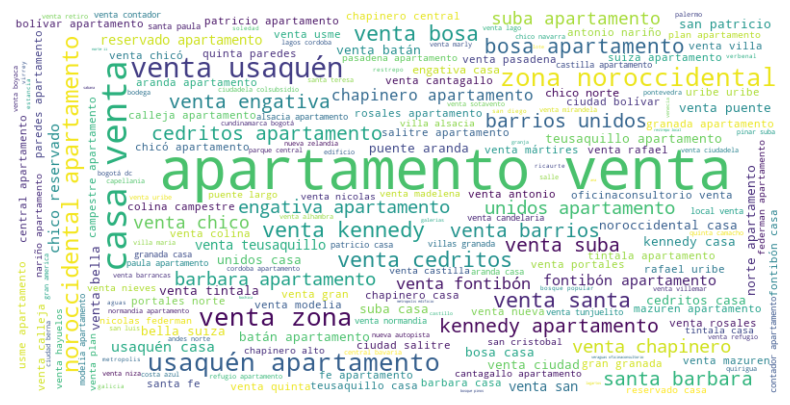

In [151]:
# I Combine all text into a single string
text = " ".join(inmuebles['Description'].astype(str).tolist())
# Remove punctuation, convert to lowercase, and remove Spanish stopwords
text = re.sub(r'[^\w\s]', '', text.lower())
stop_words = set(stopwords.words('spanish'))
text = " ".join([word for word in text.split() if word not in stop_words])
# Generate the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

In [152]:
inmuebles_type = inmuebles.Type.value_counts()

configure_plotly_browser_state()

#Creation of a dataframe called: inmuebles_localidad to know the quamtity of estates by Localidad
inmuebles_type=pd.DataFrame(inmuebles_type)
inmuebles_type=inmuebles_type.reset_index()
inmuebles_type=inmuebles_type.rename(columns={"count": "Quantity"})

figbarloc = px.bar(inmuebles_type, x='Type', y='Quantity', labels={'x':'Type of Property', 'y':'# of kind of property'}, 
                   title='Quantity of Properties by Type')


figbarloc.show()

### Histograms and Boxplots with the filtered data

In [111]:
configure_plotly_browser_state()
# Create a histogram
fig_histogram = px.histogram(inmuebles, x='Value', title='Quantity of Properties and Values',
                            barmode='overlay')

fig_histogram.update_layout(xaxis_title='Value', yaxis_title='# of Properties')
# Create a box plot
fig_boxplot = px.box(inmuebles, y='Value', title='Box Plot', labels={'Values': 'Numeric Values'})

fig_histogram.write_html('MULTIMEDIA/histogram1.html')
# fig_boxplot.save("map.html")

# Show the plots
fig_histogram.show()
fig_boxplot.show()

In [112]:
configure_plotly_browser_state()

inmuebles['Area']=inmuebles['Area'].astype('string')
inmuebles['Area']=inmuebles['Area'].astype(int)

# Create a histogram
fig_histogram = px.histogram(inmuebles, x='Area', title='Quantity of Properties According to the Area',
                            labels={'Area': 'Area','count':'# of Properties'},barmode='overlay')

# Update layout to change axis labels
fig_histogram.update_layout(xaxis_title='Area', yaxis_title='# of Properties')

# Create a box plot
fig_boxplot = px.box(inmuebles, y='Area', title='Box Plot', labels={'Area': 'Area','count':'# of Properties'})

fig_histogram.write_html('MULTIMEDIA/histogram2.html')

# Show the plots
fig_histogram.show()
fig_boxplot.show()

## Then I searched repeated rows, but i didn't find anyone


In [113]:
# Check for all occurrences of duplicate rows
duplicates_mask = inmuebles.duplicated(keep=False)

# Display the DataFrame with a new column indicating duplicates
inmuebles['IsDuplicate'] = duplicates_mask

print("DataFrame with duplicates marked:")

duplicate_rows = inmuebles[duplicates_mask]

print("Duplicate rows:")
print(duplicate_rows)

inmuebles=inmuebles.drop('IsDuplicate', axis =1)

DataFrame with duplicates marked:
Duplicate rows:
Empty DataFrame
Columns: [Type, Description, Value, id, Neighborhood, Localidad, Zone, Rooms, Bathrooms, Area, IsDuplicate]
Index: []


#Now we are going to see in plots the data available.

## First, an analysis to see the quantity of houses that are saling in each Localidad and Zone. We can see that the major part, are located in "Usaquen" and "North Zone" (Usaquen and North Zone in this case are the same part of the city of Bogota, the same situation occurs for Suba and Zona Norocidental)

<AxesSubplot: title={'center': 'Count by Localidad'}, xlabel='Localidad', ylabel='# of Properties'>

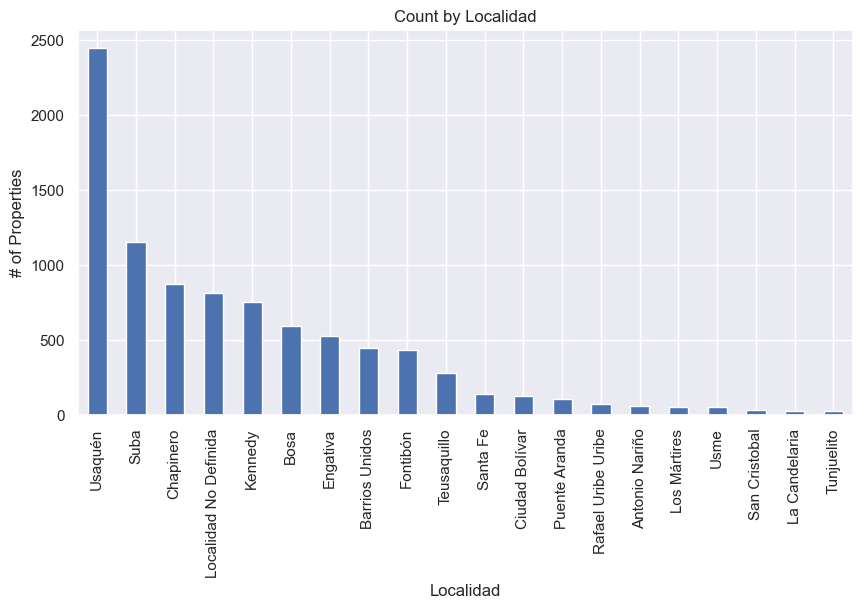

In [114]:
inmuebles_localidad = inmuebles.Localidad.value_counts()
sns.set(rc={'figure.figsize':(10, 5)})
plt.title('Count by Localidad')
plt.xlabel('Names Localidades')
plt.ylabel('# of Properties')
inmuebles_localidad.plot.bar()

I needed adjust a configuration to show correctly the plots

In [115]:
configure_plotly_browser_state()

#Creation of a dataframe called: inmuebles_localidad to know the quamtity of estates by Localidad
inmuebles_localidad=pd.DataFrame(inmuebles_localidad)
inmuebles_localidad=inmuebles_localidad.reset_index()
inmuebles_localidad=inmuebles_localidad.rename(columns={"count": "Quantity"})

figbarloc = px.bar(inmuebles_localidad, x='Localidad', y='Quantity', labels={'x':'Localidad', 'y':'# of Properties or Estates'}, 
                   title='Quantity of Estates by Localidad')


figbarloc.show()

<AxesSubplot: title={'center': 'Count by Zone'}, xlabel='Zone', ylabel='# of Properties by Zone'>

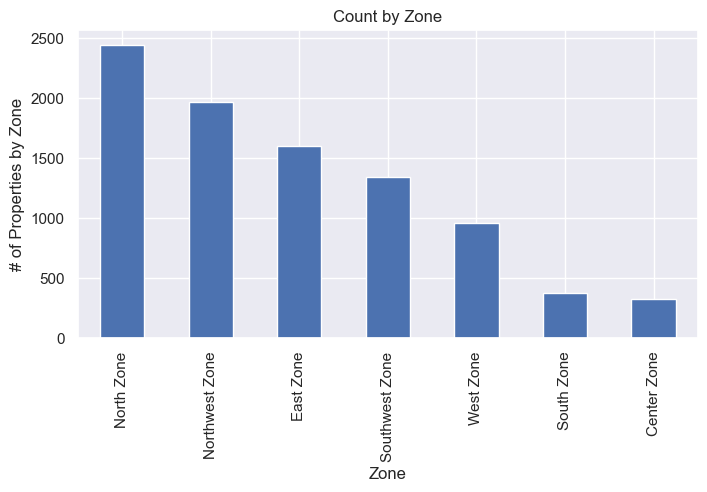

In [116]:
inmuebles_zone = inmuebles.Zone.value_counts()
sns.set(rc={'figure.figsize':(8, 4)})
plt.title('Count by Zone')
plt.xlabel('Zones')
plt.ylabel('# of Properties by Zone')
inmuebles_zone.plot.bar()

In [117]:
inmuebles_zone

Zone
North Zone        2447
Northwest Zone    1969
East Zone         1599
Southwest Zone    1341
West Zone          964
South Zone         373
Center Zone        329
Name: count, dtype: int64

In [118]:
configure_plotly_browser_state()
inmuebles_zone.iplot(kind='bar',xTitle='Zone',yTitle='# Of Properties',
                          title="# of Properties According to Zone of the City", color='blue')

### In the case of the rooms we can see that one cell has 110 rooms. When I search that specific row, I found that is a common house and is not possible that number of rooms. Other similar cases occurs with some cells, I decided delete that rows.

<AxesSubplot: title={'center': 'Quantity of Rooms'}, xlabel='Rooms', ylabel='# of Rooms'>

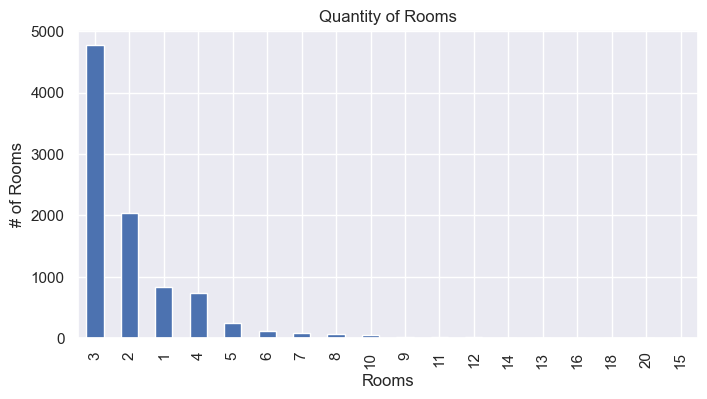

In [119]:
inmuebles_rooms = inmuebles.Rooms.value_counts()
sns.set(rc={'figure.figsize':(8, 4)})
plt.title('Quantity of Rooms')
plt.xlabel('Rooms')
plt.ylabel('# of Rooms')
inmuebles_rooms.plot.bar()

In [120]:
#delete cells with 110, 32, 11 apartamente barrio Zona Noroccidental,
# Specify the value to be deleted
value_to_delete = ['110','32']

# Delete rows with the specified value in 'Column2'
for i in value_to_delete:

  inmuebles = inmuebles[inmuebles['Rooms'] != i]

# Specify conditions to delete rows
condition1 = inmuebles['Rooms'] == '11'
condition2 = inmuebles['Neighborhood'] == 'Zona Noroccidental'

# Delete rows based on the specified conditions
inmuebles = inmuebles[~(condition1 & condition2)]

In [121]:
inmuebles_rooms = inmuebles.Rooms.value_counts()
inmuebles_rooms = pd.DataFrame(inmuebles_rooms).reset_index()
inmuebles_rooms

,Rooms,count
0,3,4779
1,2,2046
2,1,831
3,4,741
4,5,254
5,6,114
6,7,76
7,8,63
8,10,43
9,9,26


In [122]:
configure_plotly_browser_state()

# inmuebles_rooms.iplot(kind='bar',xTitle='Rooms',yTitle='# Of Properties',
#                           title="# of Properties According to the Number of Rooms", color='blue')

fig = px.bar(inmuebles_rooms,x=inmuebles_rooms['Rooms'], y=inmuebles_rooms['count'], title='Number Properties According to the Number of Rooms', color_discrete_sequence=['lightblue'])

fig.update_layout(xaxis_title='Rooms', yaxis_title='Quantity of Properties')

fig.write_html('MULTIMEDIA/bar_rooms.html')

fig.show()

<AxesSubplot: title={'center': 'Quantity of Bathrooms'}, xlabel='Bathrooms', ylabel='# of Bathrooms'>

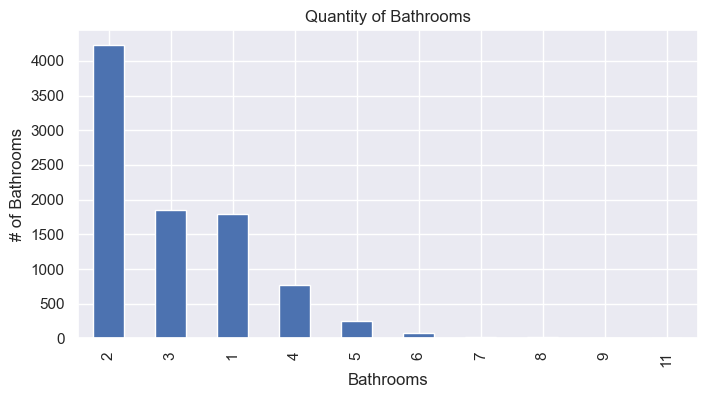

In [123]:
inmuebles_bathrooms = inmuebles.Bathrooms.value_counts()
sns.set(rc={'figure.figsize':(8, 4)})
plt.title('Quantity of Bathrooms')
plt.xlabel('Bathrooms')
plt.ylabel('# of Bathrooms')
inmuebles_bathrooms.plot.bar()

In [124]:
inmuebles_bathrooms = inmuebles.Bathrooms.value_counts()
configure_plotly_browser_state()
inmuebles_bathrooms.iplot(kind='bar',xTitle='Bathrooms',yTitle='# Of Properties',
                          title="# of Properties According to the Number of Bathrooms", color='blue')

<AxesSubplot: title={'center': 'Common size (area) of Houses'}, xlabel='Area', ylabel='# of Houses'>

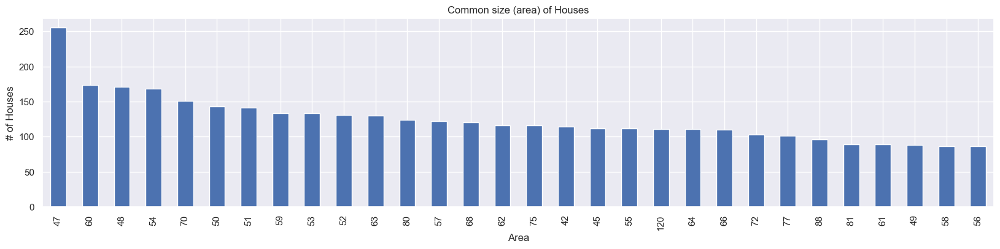

In [125]:
inmuebles_area = inmuebles.Area.value_counts()
sns.set(rc={'figure.figsize':(20, 4)})
plt.title('Common size (area) of Houses')
plt.xlabel('Area')
plt.ylabel('# of Houses')
inmuebles_area.head(30).plot.bar()

In [126]:
inmuebles_area

Area
47     256
60     174
48     171
54     168
70     151
      ... 
299      1
292      1
301      1
279      1
281      1
Name: count, Length: 344, dtype: int64

In [127]:
inmuebles_area = inmuebles.Area.value_counts()
inmuebles_area = pd.DataFrame(inmuebles_area).reset_index()
inmuebles_area = inmuebles_area.sort_values(by='count', ascending=False)
inmuebles_area=inmuebles_area.rename(columns={'index': 'Area', 'count': 'Quantities'})
inmuebles_area.head()

,Area,Quantities
0,47,256
1,60,174
2,48,171
3,54,168
4,70,151


In [128]:
inmuebles_area_20 = inmuebles_area.iloc[0:20]
inmuebles_area_20=pd.DataFrame(inmuebles_area_20)
inmuebles_area_20.info()

<class 'pandas.core.frame.DataFrame'>
Index: 20 entries, 0 to 19
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype
---  ------      --------------  -----
 0   Area        20 non-null     int32
 1   Quantities  20 non-null     int64
dtypes: int32(1), int64(1)
memory usage: 400.0 bytes


In [129]:
configure_plotly_browser_state()

# inmuebles_area_20['Area']=inmuebles_area_20['Area'].astype('string')
# inmuebles_area_20['Area']=inmuebles_area_20['Area'].astype(int)
inmuebles_area_20 = inmuebles_area_20.sort_values(by='Quantities', ascending=False)


inmuebles_area_20.iplot(kind='bar',xTitle='Area',yTitle='# Of Properties',
                          title="# of Properties According to the Area (First 20)", color='blue', x='Area', y='Quantities')

In [130]:
from plotly import graph_objs as go
import plotly.express as px

configure_plotly_browser_state()


px.bar(
    inmuebles_area_20,
    x=inmuebles_area_20["Area"],
    y=inmuebles_area_20["Quantities"],
    hover_data=["Area"],
    color="Area",
    color_discrete_sequence=px.colors.qualitative.Light24,
).update_layout(
    xaxis={"tickmode": "array", "tickvals": inmuebles_area_20["Area"], "ticktext": inmuebles_area_20["Quantities"]}
)

In [131]:
inmuebles_area_20

,Area,Quantities
0,47,256
1,60,174
2,48,171
3,54,168
4,70,151
5,50,143
6,51,141
7,59,133
8,53,133
9,52,131


In [132]:
inmuebles_area = inmuebles.Area.value_counts()
configure_plotly_browser_state()
inmuebles_area.iplot(kind='bar',xTitle='Area',yTitle='# Of Properties',
                          title="# of Properties According to the Area", color='blue')

In [133]:
inmuebles_By_zones=inmuebles.groupby('Zone')["Value"].mean().round().reset_index()
inmuebles_By_zones

,Zone,Value
0,Center Zone,461.0
1,East Zone,647.0
2,North Zone,602.0
3,Northwest Zone,478.0
4,South Zone,332.0
5,Southwest Zone,231.0
6,West Zone,413.0


Text(0, 0.5, 'Values')

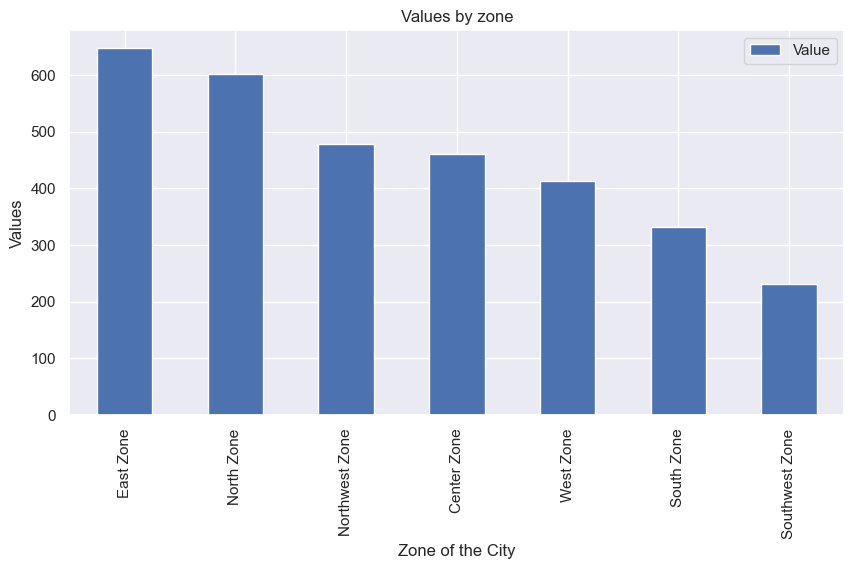

In [134]:
# inmuebles_value_zone = inmuebles_By_zones.Localidad.value_counts()
sns.set(rc={'figure.figsize':(10, 5)})

inmuebles_By_zones = inmuebles_By_zones.sort_values('Value', ascending=False)

plot=inmuebles_By_zones.plot(kind='bar', x='Zone', y='Value')
plot.set_title('Values by zone')
plot.set_xlabel('Zone of the City')
plot.set_ylabel('Values')

In [135]:
inmuebles_By_zones.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7 entries, 1 to 5
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Zone    7 non-null      object 
 1   Value   7 non-null      float64
dtypes: float64(1), object(1)
memory usage: 168.0+ bytes


In [136]:
configure_plotly_browser_state()

fig = px.bar(inmuebles_By_zones, x='Zone', y='Value', title='Mean of Values According to the Zone', color_discrete_sequence=['lightblue'])

fig.update_layout(xaxis_title='Zone', yaxis_title='Value')

fig.write_html('MULTIMEDIA/bar1.html')


# Show the plot
fig.show()

In [137]:
# inmuebles_By_zones.write_html("drive/MyDrive/Bases_Datos/file.html")

In [138]:
inmuebles['Value']=inmuebles['Value'].astype(int)
inmuebles['Zone'].value_counts()

Zone
North Zone        2447
Northwest Zone    1969
East Zone         1599
Southwest Zone    1341
West Zone          964
South Zone         373
Center Zone        329
Name: count, dtype: int64

### Creation of heatmap of correlation matrix between some numerical variables

In [139]:
inmuebles

,Type,Description,Value,id,Neighborhood,Localidad,Zone,Rooms,Bathrooms,Area
0,Apartamento,Apartamento en venta en Zona Noroccidental,360,0,Zona Noroccidental,Localidad No Definida,Northwest Zone,3,2,70
1,Casa,Casa en venta en Castilla,670,1,Castilla,Kennedy,Southwest Zone,4,3,170
2,Apartamento,Apartamento en venta en Chico Reservado,1120,2,Chico Reservado,Chapinero,East Zone,3,3,144
3,Apartamento,Apartamento en venta en Usaquén,890,3,Usaquén,Usaquén,North Zone,3,2,154
4,Apartamento,Apartamento en venta en Bella Suiza,970,4,Bella Suiza,Usaquén,North Zone,2,3,128
...,...,...,...,...,...,...,...,...,...,...
9515,Apartamento,Apartamento en venta en Kennedy,290,9515,Kennedy,Kennedy,Southwest Zone,3,2,70
9516,Apartamento,Apartamento en venta en Parque Central Bavaria,670,9516,Parque Central Bavaria,Santa Fe,Center Zone,2,2,100
9517,Local,Local en venta en Restrepo,900,9517,Restrepo,Antonio Nariño,South Zone,8,6,383
9518,Casa,Casa en venta en Engativa,335,9518,Engativa,Engativa,West Zone,3,2,183


In [140]:
Zones_by_area=inmuebles.groupby('Zone')["Area"].mean().round().reset_index()
Zones_by_area=Zones_by_area.sort_values(by=['Area'])
Zones_by_area

,Zone,Area
5,Southwest Zone,74.0
6,West Zone,103.0
0,Center Zone,104.0
3,Northwest Zone,104.0
2,North Zone,109.0
1,East Zone,113.0
4,South Zone,115.0


In [141]:
configure_plotly_browser_state()

fig = px.bar(Zones_by_area, x='Zone', y='Area', title='Mean of Area According to the Zone', color_discrete_sequence=['lightblue'])

fig.update_layout(xaxis_title='Zone', yaxis_title='Mean_Area')

fig.write_html('MULTIMEDIA/Area_bar1.html')


# Show the plot
fig.show()

In [142]:
configure_plotly_browser_state()
#Convert columns from object to int
columns_to_convert = ['Rooms', 'Bathrooms','Area']
inmuebles[columns_to_convert] = inmuebles[columns_to_convert].astype(int)
#list of zones to create correlation heatmap in one plot
list_zones=['North Zone','Northoest Zone','West Zone','Southoest Zone',
            'Oest Zone','South Zone','Center Zone']

#Creation of the subplots

inmuebles_by_int=inmuebles[['Value','Rooms', 'Bathrooms','Area','Zone']]

fig = make_subplots(rows=4, cols=2, subplot_titles=('North Zone','Northoest Zone',
                                                    'West Zone','Southoest Zone',
                                                    'Oest Zone','South Zone','Center Zone'))

r=1
c=1

for i in list_zones:

#Line to change in each cycle the name of the zone of interest
  inmuebles_by_zone=inmuebles_by_int[inmuebles_by_int['Zone']==i]
  inmuebles_by_zone=inmuebles_by_zone.drop('Zone', axis=1)

#Correlation matrix
  correlation_matrix = inmuebles_by_zone.corr()

#To create the heat map with the previous correlation matrix
  heatmap1 = go.Heatmap(z=correlation_matrix.values,
                      x=correlation_matrix.columns,
                      y=correlation_matrix.columns,
                      colorscale='Viridis',
                     coloraxis='coloraxis')

#line to add in each space each heatmap
  fig.add_trace(heatmap1, row=r, col=c)

  c=c+1

  if c == 3:

    r=r+1
    c=c-2

# Adjust of sizes and the coloraxis to avoid the bar guide for each heatmap
fig.update_layout(title='Multiple Corr Heatmaps by zones', showlegend=False,
                  margin_t=70,margin_b=50,margin_l=150,margin_r=50,
                  width=1350-50-50,height=1200-100-50, coloraxis=dict(colorbar=dict(x=-0.15)))

# Show the plot
fig.show()
fig.write_html("MULTIMEDIA/file.html")

In [143]:
#I turned the variables Type and Zone to dummy variables
inmuebles_dummy=pd.get_dummies(inmuebles['Zone'], prefix='Zon')
inmuebles_dummy_type=pd.get_dummies(inmuebles['Type'], prefix='Typ')
#I concatenated the new dataframes
inmuebles_dummy=pd.concat([inmuebles,inmuebles_dummy], axis=1)
inmuebles_dummy=pd.concat([inmuebles_dummy,inmuebles_dummy_type], axis=1)
#I deleted the old columns
inmuebles_dummy=inmuebles_dummy.drop(['Type','Description','id','Neighborhood','Localidad'], axis=1)
inmuebles_dummy

,Value,Zone,Rooms,Bathrooms,Area,Zon_Center Zone,Zon_East Zone,Zon_North Zone,Zon_Northwest Zone,Zon_South Zone,Zon_Southwest Zone,Zon_West Zone,Typ_Apartamento,Typ_Bodega,Typ_Casa,Typ_Edificio,Typ_Local,Typ_Lote,Typ_Oficina/Consultorio
0,360,Northwest Zone,3,2,70,False,False,False,True,False,False,False,True,False,False,False,False,False,False
1,670,Southwest Zone,4,3,170,False,False,False,False,False,True,False,False,False,True,False,False,False,False
2,1120,East Zone,3,3,144,False,True,False,False,False,False,False,True,False,False,False,False,False,False
3,890,North Zone,3,2,154,False,False,True,False,False,False,False,True,False,False,False,False,False,False
4,970,North Zone,2,3,128,False,False,True,False,False,False,False,True,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9515,290,Southwest Zone,3,2,70,False,False,False,False,False,True,False,True,False,False,False,False,False,False
9516,670,Center Zone,2,2,100,True,False,False,False,False,False,False,True,False,False,False,False,False,False
9517,900,South Zone,8,6,383,False,False,False,False,True,False,False,False,False,False,False,True,False,False
9518,335,West Zone,3,2,183,False,False,False,False,False,False,True,False,False,True,False,False,False,False


### I created a scatter plot to confirm a correlation to do a regression

In [144]:
configure_plotly_browser_state()
# Create a scatter plot trace
scatter = go.Scatter(x=inmuebles_dummy['Area'], y=inmuebles_dummy['Value'], mode='markers', marker=dict(size=10),
                    name='Scatter Plot', text=inmuebles_dummy['Zone'])

# Create the layout
layout = go.Layout(title='Scatter Plot', xaxis=dict(title='Area'), yaxis=dict(title='Value'))



# Create the figure
fig = go.Figure(data=[scatter], layout=layout)

model = np.polyfit(inmuebles_dummy['Area'], inmuebles_dummy['Value'], 1)
fig.add_trace(px.line(x=inmuebles_dummy['Area'], y=np.polyval(model, inmuebles_dummy['Area'])).data[0])

# Show the plot
fig.show()

In [145]:
configure_plotly_browser_state()
# Create a scatter plot trace
scatter = go.Scatter(x=inmuebles_dummy['Rooms'], y=inmuebles_dummy['Value'], mode='markers', marker=dict(size=10),
                    name='Scatter Plot', text=inmuebles_dummy['Zone'])

# Create the layout
layout = go.Layout(title='Scatter Plot', xaxis=dict(title='Rooms'), yaxis=dict(title='Value'))



# Create the figure
fig = go.Figure(data=[scatter], layout=layout)

model = np.polyfit(inmuebles_dummy['Rooms'], inmuebles_dummy['Value'], 1)
fig.add_trace(px.line(x=inmuebles_dummy['Rooms'], y=np.polyval(model, inmuebles_dummy['Rooms'])).data[0])

# Show the plot
fig.show()

In [146]:
configure_plotly_browser_state()
# Create a scatter plot trace
scatter = go.Scatter(x=inmuebles_dummy['Bathrooms'], y=inmuebles_dummy['Value'], mode='markers', marker=dict(size=10),
                    name='Scatter Plot', text=inmuebles_dummy['Zone'])

# Create the layout
layout = go.Layout(title='Scatter Plot', xaxis=dict(title='Bathrooms'), yaxis=dict(title='Value'))



# Create the figure
fig = go.Figure(data=[scatter], layout=layout)

model = np.polyfit(inmuebles_dummy['Bathrooms'], inmuebles_dummy['Value'], 1)
fig.add_trace(px.line(x=inmuebles_dummy['Bathrooms'], y=np.polyval(model, inmuebles_dummy['Bathrooms'])).data[0])

# Show the plot
fig.show()

## Model of Linear Regression

1. Train model
2. adjust
3. test model

In [147]:
np.random.seed(10)

msk=np.random.rand(len(inmuebles_dummy))<0.8
train=inmuebles_dummy[msk]
test=inmuebles_dummy[~msk]

In [148]:
train['Area']
Area=train['Area'].values.reshape

In [149]:
reg=linear_model.LinearRegression()
train_x=np.asanyarray(train[['Area']])
train_y=np.asanyarray(train[['Value']])
reg.fit(train_x,train_y)

LinearRegression()

In [150]:
print('Coeficients: ', reg.coef_)
print('Intersection: ', reg.intercept_)

Coeficients:  [[3.78949368]]
Intersection:  [101.09370632]


In [151]:
from sklearn.metrics import r2_score

test_X=np.asanyarray(test[['Area']])
test_Y=np.asanyarray(test[['Value']])
testeo=reg.predict(test_X)

In [152]:
print('error cuadratico', np.mean(np.absolute(testeo-test_Y)))
print('Suma de cuadrados residual', np.mean((testeo-test_Y)**2))
print('R2 datos entrenamiento', reg.score(train_x,train_y))
print('R2', r2_score(test_Y,testeo))

error cuadratico 156.02542014217488
Suma de cuadrados residual 55349.280342707694
R2 datos entrenamiento 0.5747950104809337
R2 0.5575058276653614


In [153]:
reg=linear_model.LinearRegression()
train_x=np.asanyarray(train[['Rooms']])
train_y=np.asanyarray(train[['Value']])
reg.fit(train_x,train_y)

LinearRegression()

In [154]:
print('Coeficients: ', reg.coef_)
print('Intersection: ', reg.intercept_)

Coeficients:  [[67.44558905]]
Intersection:  [293.12482041]


In [155]:
test_X=np.asanyarray(test[['Rooms']])
test_Y=np.asanyarray(test[['Value']])
testeo=reg.predict(test_X)

In [156]:
print('error cuadratico Rooms', np.mean(np.absolute(testeo-test_Y)))
print('Suma de cuadrados residual', np.mean((testeo-test_Y)**2))
print('R2 datos entrenamiento', reg.score(train_x,train_y))
print('R2', r2_score(test_Y,testeo))

error cuadratico Rooms 252.5807846416966
Suma de cuadrados residual 115932.97574764048
R2 datos entrenamiento 0.07375679074258157
R2 0.0731647126735826


In [157]:
reg=linear_model.LinearRegression()
train_x=np.asanyarray(train[['Bathrooms']])
train_y=np.asanyarray(train[['Value']])
reg.fit(train_x,train_y)

print('Coeficients: ', reg.coef_)
print('Intersection: ', reg.intercept_)

Coeficients:  [[226.30986401]]
Intersection:  [-33.25777026]


In [158]:
test_X=np.asanyarray(test[['Bathrooms']])
test_Y=np.asanyarray(test[['Value']])
testeo=reg.predict(test_X)

print('error cuadratico Rooms', np.mean(np.absolute(testeo-test_Y)))
print('Suma de cuadrados residual', np.mean((testeo-test_Y)**2))
print('R2 datos entrenamiento', reg.score(train_x,train_y))
print('R2', r2_score(test_Y,testeo))

error cuadratico Rooms 174.27871091462032
Suma de cuadrados residual 66780.34072732173
R2 datos entrenamiento 0.4760106574828107
R2 0.4661193169017488


In [159]:
coordenadas=gpd.read_file(r'DATOS/ZONAS.geojson')
#Numerate the rows
coordenadas['id']=np.arange(len(coordenadas))
coordenadas.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [160]:
nombres_zonas = pd.DataFrame()


zonas=['East Zone','West Zone','Northwest Zone','Southwest Zone',
       'North Zone','Center Zone','South Zone']

nombres_zonas['zonas']=None
nombres_zonas['zonas']=zonas

#Numerate the rows
nombres_zonas['id']=np.arange(len(nombres_zonas))

nombres_zonas

,zonas,id
0,East Zone,0
1,West Zone,1
2,Northwest Zone,2
3,Southwest Zone,3
4,North Zone,4
5,Center Zone,5
6,South Zone,6


In [161]:
#merge the dataframes
coordenadas = pd.merge(coordenadas, nombres_zonas, left_on='id',
                         right_on='id', how='left')
#drop the repeated column called id
coordenadas.drop(columns='id', inplace=True)
coordenadas

,geometry,zonas
0,"LINESTRING (-74.01041 4.66364, -74.01665 4.671...",East Zone
1,"LINESTRING (-74.10357 4.65325, -74.10086 4.656...",West Zone
2,"LINESTRING (-74.08115 4.69346, -74.07728 4.685...",Northwest Zone
3,"LINESTRING (-74.11834 4.63703, -74.11998 4.635...",Southwest Zone
4,"LINESTRING (-74.05676 4.68717, -74.04874 4.685...",North Zone
5,"LINESTRING (-74.11043 4.64494, -74.11807 4.636...",Center Zone
6,"LINESTRING (-74.07518 4.57035, -74.07371 4.569...",South Zone


In [162]:
map_center = [coordenadas.geometry.centroid.y.mean(), coordenadas.geometry.centroid.x.mean()]  # Swap x and y for GeoPandas
my_map = folium.Map(location=map_center, zoom_start=12)

# Add the GeoJSON data to the map
folium.GeoJson(coordenadas).add_to(my_map)

# Display the map
# my_map
my_map.save("map.html")

C:\Users\Admin\AppData\Local\Temp\ipykernel_10896\3304457036.py:1: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




In [163]:
my_map

In [164]:
# Creation of a list to choose the numeric variables to group according to the zone
mean_columns=['Area','Rooms','Bathrooms']
# group by zone and get the mean values of Values column
inmuebles_grouped=inmuebles.groupby('Zone')['Value'].agg(['mean']).round().reset_index()

inmuebles_grouped = pd.merge(inmuebles_grouped, coordenadas, left_on='Zone',
                        right_on='zonas', how='left')

inmuebles_grouped.drop(columns='zonas', inplace=True)
#Changing the name of the column mean for Mean_Values
inmuebles_grouped = inmuebles_grouped.rename(columns={'mean': 'Mean_Values'})
#Cycle to repeat the previous process with the other columns
for i in mean_columns:
  inmuebles_provit=inmuebles.groupby('Zone')[i].agg(['mean']).round().reset_index()

  inmuebles_provit = inmuebles_provit.rename(columns={'mean': 'Mean_'+i})

  inmuebles_grouped = pd.merge(inmuebles_grouped, inmuebles_provit, left_on='Zone',
                        right_on='Zone', how='left')

#turn dataframe to geodataframe
inmuebles_grouped = gpd.GeoDataFrame(inmuebles_grouped, geometry='geometry')

inmuebles_grouped

,Zone,Mean_Values,geometry,Mean_Area,Mean_Rooms,Mean_Bathrooms
0,Center Zone,461.0,"LINESTRING (-74.11043 4.64494, -74.11807 4.636...",104.0,3.0,2.0
1,East Zone,647.0,"LINESTRING (-74.01041 4.66364, -74.01665 4.671...",113.0,3.0,2.0
2,North Zone,602.0,"LINESTRING (-74.05676 4.68717, -74.04874 4.685...",109.0,3.0,3.0
3,Northwest Zone,478.0,"LINESTRING (-74.08115 4.69346, -74.07728 4.685...",104.0,3.0,2.0
4,South Zone,332.0,"LINESTRING (-74.07518 4.57035, -74.07371 4.569...",115.0,4.0,2.0
5,Southwest Zone,231.0,"LINESTRING (-74.11834 4.63703, -74.11998 4.635...",74.0,3.0,2.0
6,West Zone,413.0,"LINESTRING (-74.10357 4.65325, -74.10086 4.656...",103.0,3.0,2.0


In [165]:
from shapely.geometry import Polygon

map_center = [inmuebles_grouped.geometry.centroid.y.mean(), inmuebles_grouped.geometry.centroid.x.mean()]  # Swap x and y for GeoPandas
my_map = folium.Map(location=map_center, zoom_start=12)

polygons_grouped= gpd.GeoDataFrame(columns=['Zone','geometry','Mean_Values','Mean_Area',
                                            'Mean_Rooms','Mean_Bathrooms'])

for index, row in inmuebles_grouped.iterrows():

  polygon = Polygon(row['geometry'].coords)

  new_row = {'geometry': polygon,
              'Zone': row['Zone'],
              'Mean_Values': row['Mean_Values'],
              'Mean_Area': row['Mean_Area'],
              'Mean_Rooms': row['Mean_Rooms'],
              'Mean_Bathrooms': row['Mean_Bathrooms']}

  # polygons_grouped = polygons_grouped.append({'geometry': polygon,
  #                                             'Mean_Values': row['Mean_Values'],
  #                                             'Mean_Area': row['Mean_Area'],
  #                                             'Mean_Rooms': row['Mean_Rooms'],
  #                                             'Mean_Bathrooms': row['Mean_Bathrooms']
  #                                             },
  #                                    ignore_index=True)

  polygons_grouped = pd.concat([polygons_grouped, pd.DataFrame(new_row, index=[0])], ignore_index=True)
for index, row in polygons_grouped.iterrows():

    popup_content = f"Zone:{row['Zone']}<br>Mean_Values:{row['Mean_Values']}<br>Mean_Area: {row['Mean_Area']}<br>Mean_Rooms: {row['Mean_Rooms']}<br>Mean_Bathrooms: {row['Mean_Bathrooms']}"

    folium.GeoJson(row['geometry'],
                  #  tooltip=row['Mean_Values'],
                  popup=folium.Popup(popup_content)).add_to(my_map)

my_map.save("MULTIMEDIA/map.html")

my_map

C:\Users\Admin\AppData\Local\Temp\ipykernel_10896\3616032665.py:3: UserWarning:

Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.


C:\Users\Admin\AppData\Local\Temp\ipykernel_10896\3616032665.py:28: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.

